 **Myocardial infarction complications  Preprocessing**


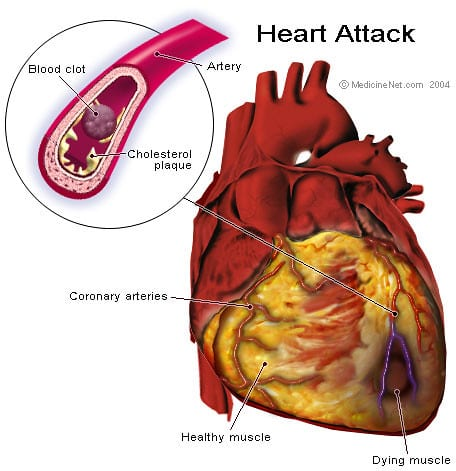




1.   **Business Understanding:**

 We are working on myocardial infarction complications, which is critical for public health due to the high incidence and mortality associated with this condition.

  Predicting and preventing complications is essential for improving patient outcomes and optimizing care.

  **Objective:** The goal is to build predictive models to understand, classify, and possibly predict complications following myocardial infarction (heart attack).

  **Importance:** Identifying complications early can help in taking preventive measures to reduce mortality, improve treatment strategies, and optimize resource allocation in healthcare settings.

The business value lies in better risk management, improving healthcare outcomes, reducing readmission rates, and preventing severe complications like heart failure, arrhythmias, or even death.



**2. Data Understanding:**

 the dataset comes from a myocardial infarction study with 1700 patients and 123 features representing various clinical characteristics and complications.

**Data Description:**
The dataset contains information on patients who suffered myocardial infarctions and records their clinical attributes as well as potential complications such as arrhythmias, heart failure, or death. The features include both binary and categorical data.

Key variables in the dataset include:

**Clinical Features:** Variables capturing aspects like heart rhythm (ECG data), blood pressure, history of hypertension, etc.

**Complications:** Potential outcomes like ventricular fibrillation, atrial fibrillation, cardiac arrest, pulmonary edema, and fatal outcomes (e.g., myocardial rupture, cardiogenic shock).


In [ ]:
pip install scikit-learn ucimlrepo matplotlib seaborn

In [ ]:
# Import librairies
import pandas as pd
from ucimlrepo import fetch_ucirepo
from sklearn.impute import KNNImputer
from IPython.core.display import HTML, Markdown, display
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np
import pprint
import urllib.request
import pickle
import os
import seaborn as sns
import sklearn
import math
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
# Fetch dataset
# myocardial_infarction_complications = fetch_ucirepo(id=579)

url = 'https://gist.github.com/mehdi-esp/0aa94a2d805a79701dc395249d5de67f/raw/da976bf125a7057ce265aeda17b0f37840a8a6b4/data.pkl'
local_file_path = 'data.pkl'

if not os.path.exists(local_file_path):
    print("Saving file...")
    with urllib.request.urlopen(url) as response:
        with open(local_file_path, 'wb') as f:
            f.write(response.read())

# Load file into variable

with open(local_file_path, 'rb') as f:
  myocardial_infarction_complications = pickle.load(f)


#  Dataset Exploration






Variable Desriptions

In [ ]:
# Examine variables
variables = myocardial_infarction_complications.variables

In [ ]:
variables[['name', 'description']]

,name,description
0,ID,Record ID (ID): Unique identifier. Cannot be r...
1,AGE,Age of patient.
2,SEX,"0: female, 1: male"
3,INF_ANAM,Quantity of myocardial infarctions in the anam...
4,STENOK_AN,Exertional angina pectoris in the anamnesis. \...
...,...,...
119,DRESSLER,Dressler syndrome
120,ZSN,Chronic heart failure
121,REC_IM,Relapse of the myocardial infarction
122,P_IM_STEN,Post-infarction angina


In [ ]:
# data (as pandas dataframes)
X = myocardial_infarction_complications.data.features
y = myocardial_infarction_complications.data.targets

In [ ]:
print(f'There are {X.shape[1]} features and {y.shape[1]} targets.')
print('Data types:', ', '.join(myocardial_infarction_complications.variables['type'].unique().tolist()))

There are 111 features and 12 targets.
Data types: Integer, Binary, Categorical, Continuous


In [ ]:
#convert the dataset into a dataframe
df = pd.concat([X, y], axis=1)

In [ ]:
df.head()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,77.0,1,2.0,1.0,1.0,2.0,NaN,3.0,0.0,7.0,...,0,0,0,0,0,0,0,0,0,0
1,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,52.0,1,0.0,0.0,0.0,2.0,NaN,2.0,0.0,2.0,...,0,0,0,0,0,0,0,0,0,0
3,68.0,0,0.0,0.0,0.0,2.0,NaN,2.0,0.0,3.0,...,0,0,0,0,0,0,1,0,0,0
4,60.0,1,0.0,0.0,0.0,2.0,NaN,3.0,0.0,7.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df.tail()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
1695,77.0,0,0.0,4.0,2.0,1.0,NaN,2.0,0.0,7.0,...,0,0,1,0,1,0,0,0,0,3
1696,70.0,0,0.0,6.0,2.0,1.0,NaN,2.0,0.0,7.0,...,0,0,0,0,0,0,0,0,0,1
1697,55.0,1,3.0,6.0,2.0,2.0,NaN,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,6
1698,79.0,0,2.0,2.0,2.0,1.0,NaN,2.0,0.0,7.0,...,0,0,0,1,0,0,0,0,0,1
1699,63.0,1,2.0,NaN,NaN,NaN,NaN,2.0,0.0,NaN,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Columns: 123 entries, AGE to LET_IS
dtypes: float64(110), int64(13)
memory usage: 1.6 MB


In [ ]:
df.shape

(1700, 123)

In [ ]:
for col in df.columns:
    print(col)

AGE
SEX
INF_ANAM
STENOK_AN
FK_STENOK
IBS_POST
IBS_NASL
GB
SIM_GIPERT
DLIT_AG
ZSN_A
nr_11
nr_01
nr_02
nr_03
nr_04
nr_07
nr_08
np_01
np_04
np_05
np_07
np_08
np_09
np_10
endocr_01
endocr_02
endocr_03
zab_leg_01
zab_leg_02
zab_leg_03
zab_leg_04
zab_leg_06
S_AD_KBRIG
D_AD_KBRIG
S_AD_ORIT
D_AD_ORIT
O_L_POST
K_SH_POST
MP_TP_POST
SVT_POST
GT_POST
FIB_G_POST
ant_im
lat_im
inf_im
post_im
IM_PG_P
ritm_ecg_p_01
ritm_ecg_p_02
ritm_ecg_p_04
ritm_ecg_p_06
ritm_ecg_p_07
ritm_ecg_p_08
n_r_ecg_p_01
n_r_ecg_p_02
n_r_ecg_p_03
n_r_ecg_p_04
n_r_ecg_p_05
n_r_ecg_p_06
n_r_ecg_p_08
n_r_ecg_p_09
n_r_ecg_p_10
n_p_ecg_p_01
n_p_ecg_p_03
n_p_ecg_p_04
n_p_ecg_p_05
n_p_ecg_p_06
n_p_ecg_p_07
n_p_ecg_p_08
n_p_ecg_p_09
n_p_ecg_p_10
n_p_ecg_p_11
n_p_ecg_p_12
fibr_ter_01
fibr_ter_02
fibr_ter_03
fibr_ter_05
fibr_ter_06
fibr_ter_07
fibr_ter_08
GIPO_K
K_BLOOD
GIPER_NA
NA_BLOOD
ALT_BLOOD
AST_BLOOD
KFK_BLOOD
L_BLOOD
ROE
TIME_B_S
R_AB_1_n
R_AB_2_n
R_AB_3_n
NA_KB
NOT_NA_KB
LID_KB
NITR_S
NA_R_1_n
NA_R_2_n
NA_R_3_n
NOT_NA_1_n
NOT_

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AGE,1692.0,61.856974,11.259936,26.0,54.0,63.0,70.0,92.0
SEX,1700.0,0.626471,0.483883,0.0,0.0,1.0,1.0,1.0
INF_ANAM,1696.0,0.554835,0.836801,0.0,0.0,0.0,1.0,3.0
STENOK_AN,1594.0,2.316186,2.440586,0.0,0.0,1.0,5.0,6.0
FK_STENOK,1627.0,1.205286,1.040814,0.0,0.0,2.0,2.0,4.0
...,...,...,...,...,...,...,...,...
DRESSLER,1700.0,0.044118,0.205417,0.0,0.0,0.0,0.0,1.0
ZSN,1700.0,0.231765,0.422084,0.0,0.0,0.0,0.0,1.0
REC_IM,1700.0,0.093529,0.291259,0.0,0.0,0.0,0.0,1.0
P_IM_STEN,1700.0,0.087059,0.282004,0.0,0.0,0.0,0.0,1.0


We notice that we have a total of 15974 NaN values


In [ ]:
df.isnull().sum().sum()

15974

In [ ]:
df.isnull().sum()

,0
AGE,8
SEX,0
INF_ANAM,4
STENOK_AN,106
FK_STENOK,73
...,...
DRESSLER,0
ZSN,0
REC_IM,0
P_IM_STEN,0


In [ ]:
a=list(df.columns)
b=[]
for i in a:
    c=df[i].isnull().sum()
    b.append(c)
null_df=pd.DataFrame({'Feature name':a,'no. of Nan':b})
null_df

,Feature name,no. of Nan
0,AGE,8
1,SEX,0
2,INF_ANAM,4
3,STENOK_AN,106
4,FK_STENOK,73
...,...,...
118,DRESSLER,0
119,ZSN,0
120,REC_IM,0
121,P_IM_STEN,0


<ipython-input-773-21b9a663bfcf>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Column', y='NaN Count', data=nan_counts_df, palette='viridis')


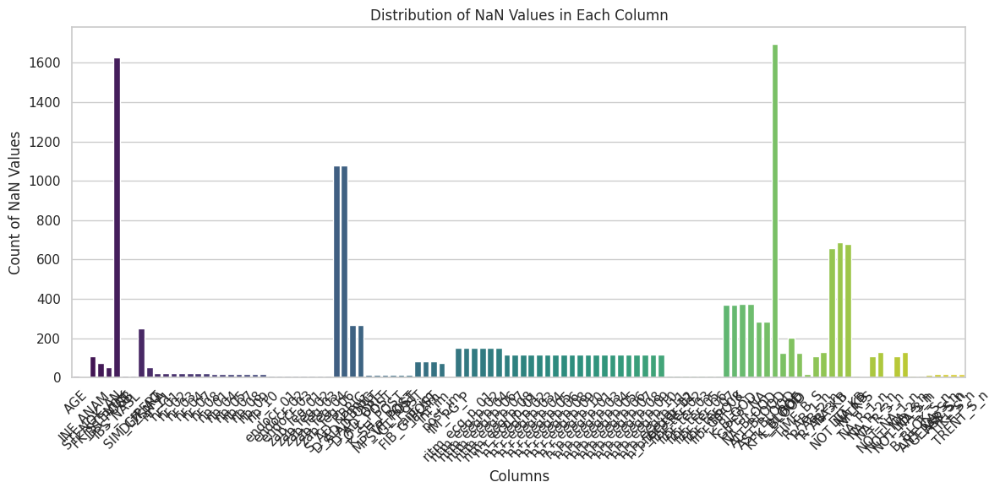

In [ ]:
# Count the number of NaN values in each column
nan_counts = df.isna().sum()

# Create a DataFrame for plotting
nan_counts_df = nan_counts[nan_counts > 0].reset_index()
nan_counts_df.columns = ['Column', 'NaN Count']

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='Column', y='NaN Count', data=nan_counts_df, palette='viridis')
plt.xticks(rotation=45)
plt.title('Distribution of NaN Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Count of NaN Values')
plt.tight_layout()
plt.show()


**Our data has:**

It has 123 columns and nearly 1700 entries and with the inequality in numbers of observations from each feature it is clear that it has got some null values. Lets try to fix them up and try to solve the problem.

# 1. Data Cleaning

## Convert relevant columns to integer from float

In [ ]:
# Extract relevant columns based on the type
relevant_columns = [
    variable['name'] for _, variable in variables.iterrows()
    if variable['type'] in ['Binary', 'Categorical', 'Integer']
    and variable['role'] != 'ID'
]

incorrect_float_columns = [
    column for column in relevant_columns if df[column].dtype == 'float64'
]

print(f"Columns with incorrect float64 data type: {incorrect_float_columns}")

Columns with incorrect float64 data type: ['AGE', 'INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'IBS_NASL', 'GB', 'SIM_GIPERT', 'DLIT_AG', 'ZSN_A', 'nr_11', 'nr_01', 'nr_02', 'nr_03', 'nr_04', 'nr_07', 'nr_08', 'np_01', 'np_04', 'np_05', 'np_07', 'np_08', 'np_09', 'np_10', 'endocr_01', 'endocr_02', 'endocr_03', 'zab_leg_01', 'zab_leg_02', 'zab_leg_03', 'zab_leg_04', 'zab_leg_06', 'S_AD_KBRIG', 'D_AD_KBRIG', 'S_AD_ORIT', 'D_AD_ORIT', 'O_L_POST', 'K_SH_POST', 'MP_TP_POST', 'SVT_POST', 'GT_POST', 'FIB_G_POST', 'ant_im', 'lat_im', 'inf_im', 'post_im', 'IM_PG_P', 'ritm_ecg_p_01', 'ritm_ecg_p_02', 'ritm_ecg_p_04', 'ritm_ecg_p_06', 'ritm_ecg_p_07', 'ritm_ecg_p_08', 'n_r_ecg_p_01', 'n_r_ecg_p_02', 'n_r_ecg_p_03', 'n_r_ecg_p_04', 'n_r_ecg_p_05', 'n_r_ecg_p_06', 'n_r_ecg_p_08', 'n_r_ecg_p_09', 'n_r_ecg_p_10', 'n_p_ecg_p_01', 'n_p_ecg_p_03', 'n_p_ecg_p_04', 'n_p_ecg_p_05', 'n_p_ecg_p_06', 'n_p_ecg_p_07', 'n_p_ecg_p_08', 'n_p_ecg_p_09', 'n_p_ecg_p_10', 'n_p_ecg_p_11', 'n_p_ecg_p_12', 'fibr_ter

In [ ]:
for column in incorrect_float_columns:
    df[column] = df[column].astype('Int64')

incorrect_float_columns = [
    column for column in relevant_columns if df[column].dtype == 'float64'
]
print(f"Columns with incorrect float64 data type: {incorrect_float_columns}")

Columns with incorrect float64 data type: []


## Categorical and Binary values cleaning

### Illegal Categorical values

In [ ]:
# Dictionary to store the parsed values for each categorical variable using dict comprehension
categorical_legal_values = {
    variable['name']: list(map(int, re.findall(r"^\s*(\d+):", variable['description'], re.MULTILINE)))
    for _, variable in variables[variables['type'] == 'Categorical'].iterrows()
}

# Print the parsed values for each categorical variable
pprint.pprint(categorical_legal_values)

{'DLIT_AG': [1, 2, 3, 4, 5, 6, 7],
 'FK_STENOK': [0, 1, 2, 3, 4],
 'GB': [0, 1, 2, 3],
 'IBS_POST': [0, 1, 2],
 'INF_ANAM': [0, 1, 2, 3],
 'LET_IS': [0, 1, 2, 3, 4, 5, 6, 7],
 'NOT_NA_1_n': [0, 1, 2, 3, 4],
 'R_AB_1_n': [0, 1, 2, 3],
 'R_AB_2_n': [0, 1, 2, 3],
 'R_AB_3_n': [0, 1, 2, 3],
 'STENOK_AN': [0, 1, 2, 3, 4, 5],
 'TIME_B_S': [1, 2, 3, 4, 5, 6, 7, 8, 9],
 'ZSN_A': [0, 1, 2, 3, 4],
 'ant_im': [0, 1, 2, 3, 4],
 'inf_im': [0, 1, 2, 3, 4],
 'lat_im': [0, 1, 2, 3, 4],
 'post_im': [0, 1, 2, 3, 4]}


In [ ]:
def check_illegal_values():
    illegal_values_report = {}

    for column in categorical_legal_values:
        # Get the valid values for the current column
        valid_values = categorical_legal_values[column]

        # Identify illegal values in the dataframe column
        illegal_values = df[column][~df[column].isin(valid_values)].dropna().unique()

        if illegal_values.size > 0:
            illegal_values_report[column] = illegal_values

    return illegal_values_report

# Call the function to check for illegal values
illegal_values_report = check_illegal_values()

# Print the report of columns with illegal values
print(f"There are {len(illegal_values_report)} categorical columns with illegal values.")
for column, illegal in illegal_values_report.items():
    print(f"{column} has illegal values: {illegal}")

There are 2 categorical columns with illegal values.
STENOK_AN has illegal values: <IntegerArray>
[6]
Length: 1, dtype: Int64
DLIT_AG has illegal values: <IntegerArray>
[0]
Length: 1, dtype: Int64


In [ ]:
# Remove illegal values
for column in illegal_values_report:
    df[column] = df[column].replace(illegal_values_report[column], np.nan)

In [ ]:
illegal_values_report = check_illegal_values()
print(f"There are {len(illegal_values_report)} categorical columns with illegal values.")

There are 0 categorical columns with illegal values.


### Illegal Binary values

In [ ]:
# Extract relevant binary columns based on the type
binary_columns = [
    variable['name'] for _, variable in variables.iterrows()
    if variable['type'] == 'Binary'
]

# Count binary columns with illegal values
illegal_binary_column_count = sum(
    df[column][~df[column].isin([0, 1])].dropna().count() > 0 for column in binary_columns
)

# Print the count of binary columns with illegal values
print(f"Number of binary columns with illegal values: {illegal_binary_column_count}")

Number of binary columns with illegal values: 0


## Rest of cleaning

In [ ]:
# Step 1: Drop duplicate rows
duplicate_rows = df[df.duplicated()]
if not duplicate_rows.empty:
    print("Duplicate Rows:")
    print(duplicate_rows)
df = df.drop_duplicates()

# Step 2: Drop duplicate columns
duplicate_columns = df.T[df.T.duplicated()].index
if not duplicate_columns.empty:
    print("\nDuplicate Columns:")
    print(duplicate_columns.tolist())
df = df.loc[:, ~df.columns.duplicated()]
df.shape

(1700, 123)

We don't have duplicated rows and columns

In [ ]:
# Drop columns with more than 70% missing values
threshold = 0.7 * len(df)
df = df.dropna(thresh=threshold, axis=1)

# Drop rows with more than 50% missing values
threshold_row = 0.5 * len(df.columns)
df_cleaned = df.dropna(thresh=threshold_row)

In [ ]:
df.isnull().sum().sum()

8562

In [ ]:
df.shape

(1700, 115)

There is 7 columns  that have more than  70% missing values


In [ ]:
# Numeric imputation
print("Total NaN values before numeric imputation:", df.isnull().sum().sum())

# Identify columns with more than 250 NaN values
numerical_cols = variables[(variables['type'].isin(['Continuous','Integer'])) & (variables['role'] != 'ID')]['name'].tolist()

columns_with_many_nans = [col for col in df.columns if col in numerical_cols and df[col].isna().sum()/len(df.index) > 0.15]

int_cols = variables[(variables['type'] == 'Integer') & (variables['name'].isin(columns_with_many_nans))]['name'].to_list()

continuous_cols = variables[(variables['type'] == 'Continuous') & (variables['name'].isin(columns_with_many_nans))]['name'].to_list()

# Fill continuous NaN values with the mean
df[continuous_cols] = df[continuous_cols].fillna(df[continuous_cols].mean())

# Fill integer NaN values with the rounded mean
df[int_cols] = df[int_cols].fillna(df[int_cols].mean().round())

# Optionally, you can check the DataFrame to confirm the changes
print("Total NaN values after numeric imputation:", df.isnull().sum().sum())

Total NaN values before numeric imputation: 8562
Total NaN values after numeric imputation: 6713


In [ ]:
print("Total NaN values before categorical and binary imputation:", df.isnull().sum().sum())

categorical_and_binary_cols = [ col for col in variables[(variables['type'].isin(['Categorical','Binary'])) & (variables['role'] != 'ID')]['name'].to_list() if col in df]

df[categorical_and_binary_cols] = df[categorical_and_binary_cols].fillna(df[categorical_and_binary_cols].mode().iloc[0])

print("Total NaN values after categorical and binary imputation:", df.isnull().sum().sum())
df.shape

Total NaN values before categorical and binary imputation: 6713
Total NaN values after categorical and binary imputation: 821


(1700, 115)

In [ ]:
num_columns_with_nan = df.isna().any().sum()
print(f"Number of columns with NaN values: {num_columns_with_nan}")

Number of columns with NaN values: 8


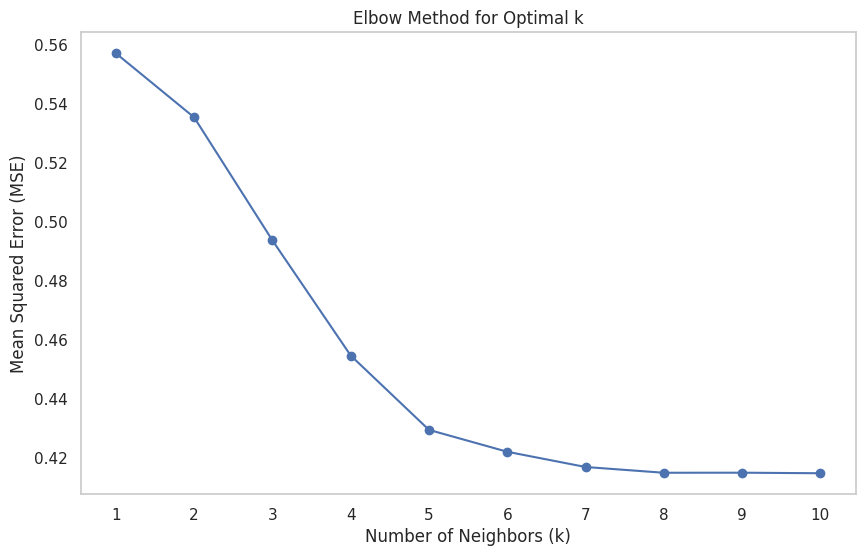

In [ ]:
def elbow_method(df, max_k=10):
    errors = []

    for k in range(1, max_k + 1):
        imputer = KNNImputer(n_neighbors=k)
        imputed_data = imputer.fit_transform(df)
        # Calculate the mean squared error (MSE) based on the original values
        mse = np.mean((df.fillna(0) - imputed_data) ** 2)
        errors.append(mse)

    return errors

# Run the elbow method
max_k = 10
errors = elbow_method(df, max_k)

# Plotting the errors
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k + 1), errors, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean Squared Error (MSE)')
plt.xticks(range(1, max_k + 1))
plt.grid()
plt.show()

In [ ]:
# Initialize KNNImputer with the number of neighbors (k)
k = 5  # You can adjust this value
imputer = KNNImputer(n_neighbors=k)
# Fit and transform the DataFrame
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

print("\nAfter KNN imputation:")
print(df.isna().sum().sum())
df.shape


After KNN imputation:
0


(1700, 115)

2. **Dealing with Outliers**



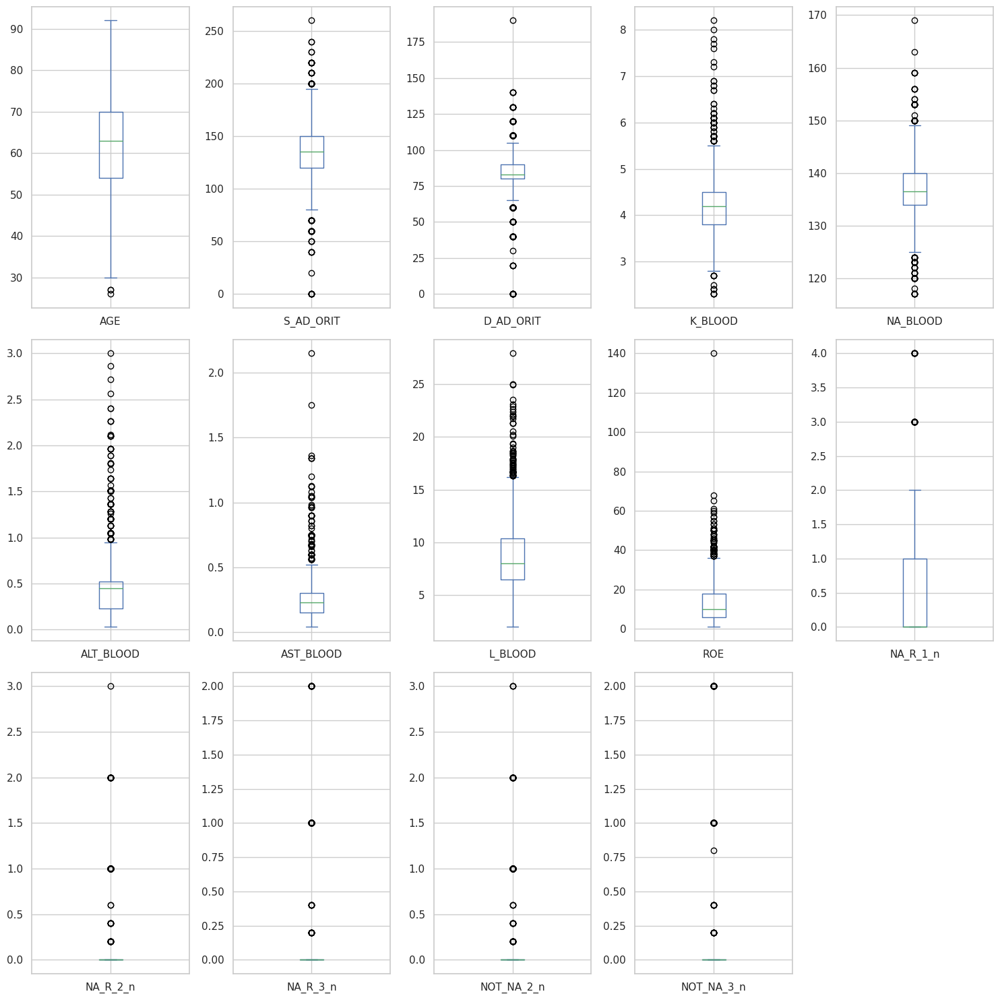

(1700, 115)

In [ ]:


# Assuming df is your DataFrame and cont_vars are your continuous variables
numerical_cols = variables[(variables['type'].isin(['Continuous','Integer'])) & (variables['role'] != 'ID')]['name'].tolist()
cont_vars = df[[col for col in numerical_cols if col in df]].columns

# Function to visualize outliers using boxplots
def outliers_visual(data):
    # Set the number of boxplots per row
    n_cols = 5
    # Calculate the number of rows needed based on the number of columns
    n_rows = math.ceil(len(cont_vars) / n_cols)

    # Create the figure
    plt.figure(figsize=(15, 5 * n_rows))  # Adjust the height dynamically based on rows
    i = 0
    for col in cont_vars:
        i += 1
        plt.subplot(n_rows, n_cols, i)  # 3 plots per row
        data[col].plot.box()  # Use the .plot.box() for each column
        # plt.title(f'{col} boxplot')

    plt.tight_layout()  # Adjust the layout to prevent overlapping
    plt.show()

# Visualize the boxplots for the original data (or you can apply scaling beforehand)
outliers_visual(df)
df.shape


we are going to use ehe interquartile (IQR) method of outlier detection uses 1.5 as its scale to detect outliers because it most closely follows Gaussian distribution. As a result, the method dictates that any data point that's 1.5 points below the lower bound quartile or above the upper bound quartile is an outlier.

In [ ]:
import pandas as pd

def remove_outliers_iqr_specified_columns(df, columns):

    # Iterate over each specified column
    for column in columns:
          # Calculate Q1 (25th percentile) and Q3 (75th percentile) for the column
          Q1 = df[column].quantile(0.25)
          Q3 = df[column].quantile(0.75)

          # Calculate the IQR (Interquartile Range)
          IQR = Q3 - Q1

          # Define bounds for outliers
          lower_bound = Q1 - 1.5 * IQR
          upper_bound = Q3 + 1.5 * IQR

          # Remove rows where the values in the column are outliers
          df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

    return df


In [ ]:
columns_to_clean = ['S_AD_ORIT','D_AD_ORIT','K_BLOOD','NA_BLOOD','ALT_BLOOD','AST_BLOOD','L_BLOOD']
df=remove_outliers_iqr_specified_columns(df,columns_to_clean)
df.shape


(1078, 115)

# **Feature Selection**

In [ ]:
myocardial_infarction_complications.data.targets

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1695,0,0,0,0,1,0,1,0,0,0,0,3
1696,0,0,0,0,0,0,0,0,0,0,0,1
1697,0,0,0,0,0,0,0,0,0,1,0,6
1698,0,0,0,0,0,1,0,0,0,0,0,1


In [ ]:
def plot_correlation_map( df ):

    corr = df.corr()

    s, ax = plt.subplots( figsize =( 200, 200 ) )

    cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )

    s = sns.heatmap(
        corr,
        cmap = cmap,
        square=True,
        cbar_kws={ 'shrink' : .9 },
        ax=ax,
        annot = True,
        annot_kws = { 'fontsize' : 12 }
    )

plot_correlation_map(df)

In [ ]:
# Define the model
model = RandomForestClassifier()

# Initialize RFE
rfe = RFE(model, n_features_to_select=10)  # Select top 10 features
rfe = rfe.fit(X, y)

# Get the selected feature names
selected_features_rfe = X.columns[rfe.support_]
print(selected_features_rfe)


Index(['AGE', 'S_AD_ORIT', 'D_AD_ORIT', 'K_BLOOD', 'NA_BLOOD', 'ALT_BLOOD',
       'AST_BLOOD', 'L_BLOOD', 'ROE', 'TIME_B_S'],
      dtype='object')


# Feature Transformation

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler instance
scaler = MinMaxScaler(feature_range=(0, 1))

# Replace 'variables' with your actual DataFrame name that holds the column info
numerical_cols = [col for col in df.columns if
                  (variables[variables['name'] == col].type == 'Continuous').item()]
# Fit and transform the numerical columns only
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])
df

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,GB,SIM_GIPERT,ZSN_A,nr_11,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,77.0,1.0,2.0,1.0,1.0,2.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,55.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,52.0,1.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,68.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,60.0,1.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1688,77.0,1.0,1.0,5.0,2.0,2.0,2.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0
1690,77.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
1691,62.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
1692,71.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0


# Feature engineering

In [ ]:
# Assuming you have your DataFrame named 'df'
unique_ages = df['AGE'].unique()

# Display the unique ages
print("Unique Ages:", unique_ages)

def feature_engineering_on_age(df):
    # Binning/Age Groups
    bins = [0, 18, 35, 50, 65, 100]
    labels = [1,2, 3, 4, 5]
    df['AGE_GROUP'] = pd.cut(df['AGE'], bins=bins, labels=labels, right=False)
    return df

# Apply the feature engineering
df = feature_engineering_on_age(df)

# Display the updated DataFrame
print(df.head())

Unique Ages: [77.  55.  52.  68.  60.  64.  70.  65.  54.  71.  83.  63.  67.  82.
 53.  44.  72.  78.  59.  73.  56.  43.  58.  57.  48.  45.  76.  62.
 61.  80.  46.  47.  41.  74.  42.  49.  50.  38.  62.8 51.  66.  69.
 32.  86.  88.  79.  35.  84.  27.  87.  75.  37.  34.  39.  81.  33.
 40.  36.  85.  92.  62.6 53.8 90.  58.8]
    AGE  SEX  INF_ANAM  STENOK_AN  FK_STENOK  IBS_POST   GB  SIM_GIPERT  \
0  77.0  1.0       2.0        1.0        1.0       2.0  3.0         0.0   
1  55.0  1.0       1.0        0.0        0.0       0.0  0.0         0.0   
2  52.0  1.0       0.0        0.0        0.0       2.0  2.0         0.0   
3  68.0  0.0       0.0        0.0        0.0       2.0  2.0         0.0   
4  60.0  1.0       0.0        0.0        0.0       2.0  3.0         0.0   

   ZSN_A  nr_11  ...  FIBR_JELUD  A_V_BLOK  OTEK_LANC  RAZRIV  DRESSLER  ZSN  \
0    0.0    0.0  ...         0.0       0.0        0.0     0.0       0.0  0.0   
1    0.0    0.0  ...         0.0       0.0        0.0 

# Dimensionality Reduction

Explained variance by each component: [0.67319441 0.22719351 0.04885644 0.01549173]


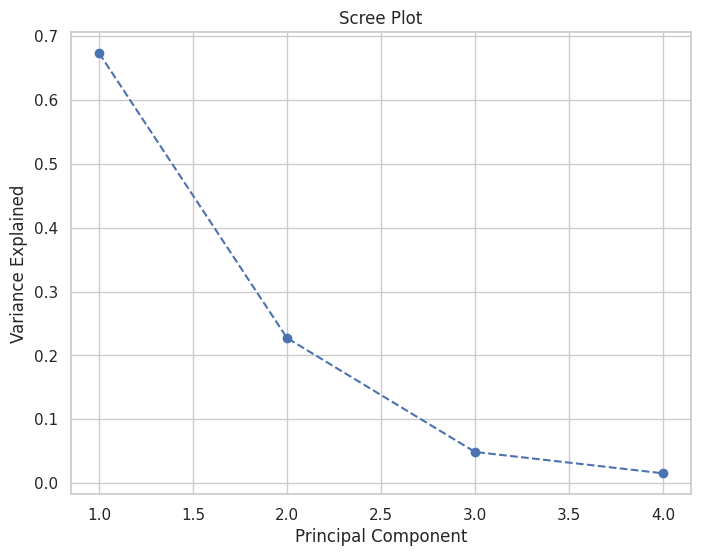

            PC1        PC2        PC3       PC4   AGE  SEX  INF_ANAM  \
0     46.998465   9.977922   0.160084 -0.801118  77.0  1.0       2.0   
1    -14.746964  -6.433551  10.756658 -2.732172  55.0  1.0       1.0   
2     44.269849 -14.865745  -1.833504 -2.318847  52.0  1.0       0.0   
3    -20.333313   8.835309  -6.800532 -1.926527  68.0  0.0       0.0   
4     23.099167  -4.431604  -3.119756  4.284792  60.0  1.0       0.0   
...         ...        ...        ...       ...   ...  ...       ...   
1688        NaN        NaN        NaN       NaN  77.0  1.0       1.0   
1690        NaN        NaN        NaN       NaN  77.0  1.0       0.0   
1691        NaN        NaN        NaN       NaN  62.0  1.0       0.0   
1692        NaN        NaN        NaN       NaN  71.0  0.0       0.0   
1694        NaN        NaN        NaN       NaN  77.0  0.0       0.0   

      STENOK_AN  FK_STENOK  IBS_POST  ...  FIBR_JELUD  A_V_BLOK  OTEK_LANC  \
0           1.0        1.0       2.0  ...         0.0    

In [ ]:


# Step 1: Create a PCA instance
# You can define the number of components, e.g., 0.95 for preserving 95% of variance, or choose a specific number like n_components=10
pca = PCA(n_components=0.95)

# Step 2: Fit PCA on the scaled data
pca.fit(df)

# Step 3: Transform the data
pca_data = pca.transform(df)

# Convert the PCA result into a DataFrame
pca_df = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(pca_data.shape[1])])

# Step 4: Combine the PCA components with categorical columns (if any)
final_df_pca = pd.concat([pca_df, df.drop(columns=numerical_cols)], axis=1)

# Step 5: Analyze variance explained by PCA
explained_variance = pca.explained_variance_ratio_
print("Explained variance by each component:", explained_variance)

# Step 6: (Optional) Plot a scree plot to visualize the explained variance
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

print(final_df_pca)

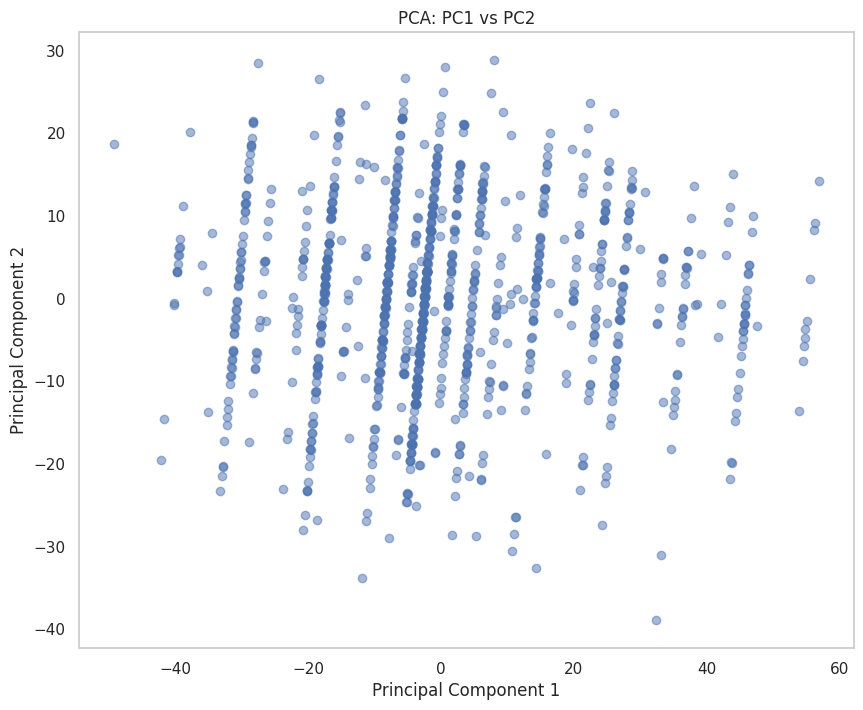

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.title('PCA: PC1 vs PC2')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()


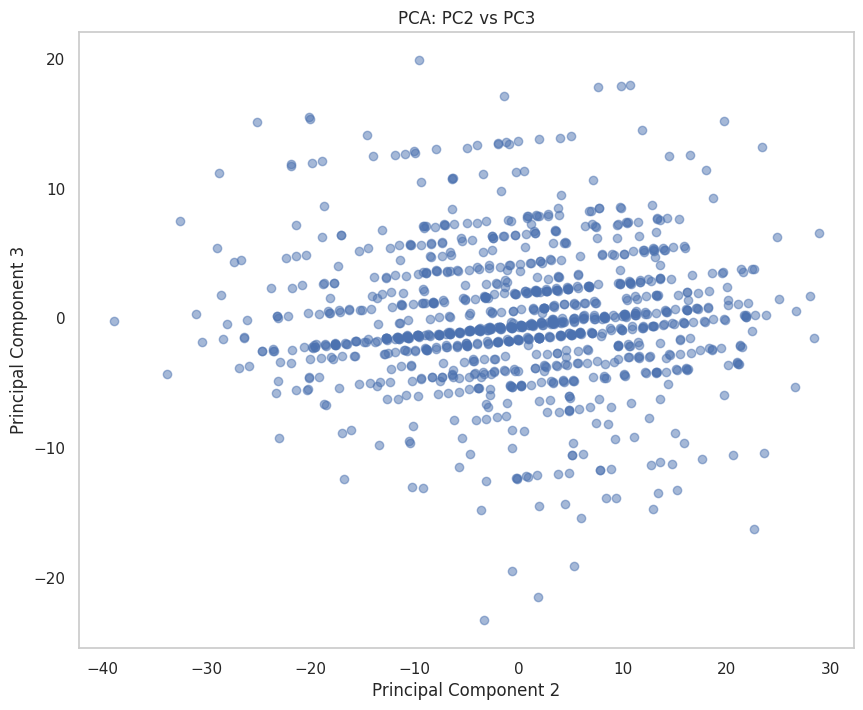

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(pca_df['PC2'], pca_df['PC3'], alpha=0.5)
plt.title('PCA: PC2 vs PC3')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.grid()
plt.show()